# Semana 6 - Actividad Visualización
- Estudiante: Christian Suárez Gil - A01793933
- 26 Octubre 2022
- Ciencia de Datos
- María de la Paz Rico Fernández

### 1. Cargue de la información

In [61]:
import pandas as pd
import numpy as np
import plotly.io as pio
pio.templates.default = "plotly_white"
import plotly.express as px

In [25]:
data_inicial = pd.read_csv('https://raw.githubusercontent.com/PosgradoMNA/Actividades_Aprendizaje-/main/default%20of%20credit%20card%20clients.csv')
data_inicial.head()

,ID,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,1,20000,2.0,2.0,1.0,24.0,2.0,2.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1.0
1,2,120000,2.0,2.0,2.0,26.0,-1.0,2.0,0.0,0.0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1.0
2,3,90000,2.0,2.0,2.0,34.0,0.0,0.0,0.0,0.0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0.0
3,4,50000,2.0,2.0,1.0,37.0,0.0,0.0,0.0,0.0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0.0
4,5,50000,1.0,2.0,1.0,57.0,-1.0,0.0,-1.0,0.0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0.0


### 2. Obtención de información inicial del Data Set

Vemos que las columnas no son muy informativas por lo cual será mejor cambiarles el nombre con base en el diccionario

In [26]:
## Generar los nombres de las columnas

def create_list(word,number):
    lista = []
    for i in range(1,number+1):
        lista.append(word +str(i))
    return lista

repayment_list = create_list('repayment',6)
bill_list = create_list('bill_amount',6)
payment_list = create_list('payment_amount',6)


column_names = ['id','credit_amount','gender','education','marital_status','age'] + repayment_list + bill_list +payment_list +['default']

## Hacer una copia del data frame para tener el original disponible
data_trans = data_inicial.copy()
data_trans.columns = column_names 
data_trans.head()

,id,credit_amount,gender,education,marital_status,age,repayment1,repayment2,repayment3,repayment4,...,bill_amount4,bill_amount5,bill_amount6,payment_amount1,payment_amount2,payment_amount3,payment_amount4,payment_amount5,payment_amount6,default
0,1,20000,2.0,2.0,1.0,24.0,2.0,2.0,-1.0,-1.0,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1.0
1,2,120000,2.0,2.0,2.0,26.0,-1.0,2.0,0.0,0.0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1.0
2,3,90000,2.0,2.0,2.0,34.0,0.0,0.0,0.0,0.0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0.0
3,4,50000,2.0,2.0,1.0,37.0,0.0,0.0,0.0,0.0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0.0
4,5,50000,1.0,2.0,1.0,57.0,-1.0,0.0,-1.0,0.0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0.0


Ahora revisemos que tipo de datos tenemos

In [27]:
data_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               30000 non-null  int64  
 1   credit_amount    30000 non-null  int64  
 2   gender           29999 non-null  float64
 3   education        29998 non-null  float64
 4   marital_status   29998 non-null  float64
 5   age              29995 non-null  float64
 6   repayment1       29997 non-null  float64
 7   repayment2       29995 non-null  float64
 8   repayment3       29993 non-null  float64
 9   repayment4       29991 non-null  float64
 10  repayment5       29984 non-null  float64
 11  repayment6       29986 non-null  float64
 12  bill_amount1     29989 non-null  float64
 13  bill_amount2     29989 non-null  float64
 14  bill_amount3     29987 non-null  float64
 15  bill_amount4     29985 non-null  float64
 16  bill_amount5     29983 non-null  float64
 17  bill_amount6

Todas las variables fueron cargadas como numéricas. Sin embargo al leer el diccionario vemos hay algunas de ellas que son realmente categoricas u ordinales, por lo cual tendremos que tener esto en cuenta al realizar procesos como imputación.

In [28]:
data_trans.shape

(30000, 25)

Vemos que tenemos 30.000 registros y 25 columnas.

In [29]:
data_trans.isna().sum()

id                  0
credit_amount       0
gender              1
education           2
marital_status      2
age                 5
repayment1          3
repayment2          5
repayment3          7
repayment4          9
repayment5         16
repayment6         14
bill_amount1       11
bill_amount2       11
bill_amount3       13
bill_amount4       15
bill_amount5       17
bill_amount6       10
payment_amount1     8
payment_amount2     9
payment_amount3     8
payment_amount4    11
payment_amount5    11
payment_amount6     5
default             3
dtype: int64

Vemos que los NA son muy pocos, pero revisemoslos a mayor profundidad para ver su estructura

In [30]:
data_trans[data_trans.isna().any(axis=1)]

,id,credit_amount,gender,education,marital_status,age,repayment1,repayment2,repayment3,repayment4,...,bill_amount4,bill_amount5,bill_amount6,payment_amount1,payment_amount2,payment_amount3,payment_amount4,payment_amount5,payment_amount6,default
18,19,360000,2.0,1.0,1.0,49.0,1.0,-2.0,-2.0,-2.0,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
38,39,50000,1.0,1.0,2.0,25.0,1.0,-1.0,-1.0,-2.0,...,0.0,0.0,NaN,780.0,0.0,0.0,0.0,0.0,0.0,1.0
49,50,20000,1.0,1.0,2.0,24.0,0.0,0.0,0.0,0.0,...,19865.0,20480.0,20063.0,1318.0,1315.0,704.0,928.0,912.0,1069.0,0.0
64,65,130000,2.0,2.0,1.0,51.0,-1.0,-1.0,-2.0,-2.0,...,0.0,2353.0,0.0,0.0,NaN,0.0,2353.0,0.0,0.0,0.0
160,161,30000,1.0,1.0,2.0,41.0,2.0,2.0,2.0,NaN,...,28168.0,27579.0,28321.0,3500.0,0.0,2200.0,NaN,1200.0,1250.0,0.0
173,174,50000,2.0,1.0,2.0,24.0,1.0,-2.0,-2.0,-2.0,...,-2898.0,-3272.0,-3272.0,0.0,0.0,0.0,NaN,0.0,0.0,1.0
175,176,130000,1.0,3.0,1.0,56.0,1.0,2.0,2.0,2.0,...,68557.0,NaN,71345.0,3000.0,3000.0,3000.0,5500.0,0.0,0.0,1.0
182,183,500000,2.0,1.0,1.0,NaN,0.0,0.0,0.0,0.0,...,122967.0,108834.0,70064.0,70010.0,30357.0,30000.0,20000.0,52183.0,20000.0,0.0
219,220,310000,2.0,1.0,2.0,NaN,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,4542.0,126.0,0.0,0.0,0.0,0.0,0.0
233,234,190000,1.0,2.0,2.0,34.0,2.0,0.0,0.0,0.0,...,142323.0,140120.0,150052.0,5000.0,5000.0,10000.0,0.0,12118.0,2769.0,1.0


### 3. Tratamiento de N/As

En el analisis anterior vimos que hay algunos registros que solo tienen un NA, pero otros tienen varios. En estos ultimos no sería conveniente realizar una imputación, dado que estaríamos "inventando" gran parte de la información de ese registro. Por lo tanto vamos a eliminar las filas que tengan más de 2 NA.

In [31]:
data_trans = data_trans.dropna(thresh=(len(data_trans.columns)-2))

Ahora revisemos nuevamente con cuantos NA quedamos por variable

In [32]:
data_trans.isna().sum()

id                 0
credit_amount      0
gender             0
education          0
marital_status     0
age                3
repayment1         0
repayment2         0
repayment3         2
repayment4         4
repayment5         8
repayment6         6
bill_amount1       0
bill_amount2       0
bill_amount3       1
bill_amount4       3
bill_amount5       5
bill_amount6       1
payment_amount1    0
payment_amount2    1
payment_amount3    0
payment_amount4    3
payment_amount5    3
payment_amount6    2
default            0
dtype: int64

Como vemos, todos los na que tenemos corresponden a variables numericas, por lo cual los reemplazaremos por la mediana

In [33]:
mask_nas = data_trans.isna().any(axis=1)
data_trans[column_names ] = data_trans[column_names ].fillna(data_trans[column_names ].median())

Para finalizar revisemos que si se haya reemplazado cada na por la mediana de su respectiva columna

In [34]:
data_trans[mask_nas]

,id,credit_amount,gender,education,marital_status,age,repayment1,repayment2,repayment3,repayment4,...,bill_amount4,bill_amount5,bill_amount6,payment_amount1,payment_amount2,payment_amount3,payment_amount4,payment_amount5,payment_amount6,default
38,39,50000,1.0,1.0,2.0,25.0,1.0,-1.0,-1.0,-2.0,...,0.0,0.0,17077.0,780.0,0.0,0.0,0.0,0.0,0.0,1.0
49,50,20000,1.0,1.0,2.0,24.0,0.0,0.0,0.0,0.0,...,19865.0,20480.0,20063.0,1318.0,1315.0,704.0,928.0,912.0,1069.0,0.0
64,65,130000,2.0,2.0,1.0,51.0,-1.0,-1.0,-2.0,-2.0,...,0.0,2353.0,0.0,0.0,2009.0,0.0,2353.0,0.0,0.0,0.0
160,161,30000,1.0,1.0,2.0,41.0,2.0,2.0,2.0,0.0,...,28168.0,27579.0,28321.0,3500.0,0.0,2200.0,1500.0,1200.0,1250.0,0.0
173,174,50000,2.0,1.0,2.0,24.0,1.0,-2.0,-2.0,-2.0,...,-2898.0,-3272.0,-3272.0,0.0,0.0,0.0,1500.0,0.0,0.0,1.0
175,176,130000,1.0,3.0,1.0,56.0,1.0,2.0,2.0,2.0,...,68557.0,18107.0,71345.0,3000.0,3000.0,3000.0,5500.0,0.0,0.0,1.0
182,183,500000,2.0,1.0,1.0,34.0,0.0,0.0,0.0,0.0,...,122967.0,108834.0,70064.0,70010.0,30357.0,30000.0,20000.0,52183.0,20000.0,0.0
219,220,310000,2.0,1.0,2.0,34.0,-1.0,-1.0,-1.0,-1.0,...,0.0,0.0,0.0,4542.0,126.0,0.0,0.0,0.0,0.0,0.0
233,234,190000,1.0,2.0,2.0,34.0,2.0,0.0,0.0,0.0,...,142323.0,140120.0,150052.0,5000.0,5000.0,10000.0,0.0,12118.0,2769.0,1.0
239,240,140000,2.0,2.0,3.0,34.0,0.0,0.0,0.0,0.0,...,19068.0,16409.0,16383.0,3000.0,2000.0,2198.0,1000.0,3000.0,2399.0,1.0


### 4. Cálculo de estadisticas centrales y de dispersión

In [35]:
data_trans.describe().T

,count,mean,std,min,25%,50%,75%,max
id,29988.0,14997.515906,8658.125501,1.0,7500.75,14997.5,22494.25,30000.0
credit_amount,29988.0,167497.655062,129735.297746,10000.0,50000.00,140000.0,240000.00,1000000.0
gender,29988.0,1.603908,0.489092,1.0,1.00,2.0,2.00,2.0
education,29988.0,1.853075,0.790375,0.0,1.00,2.0,2.00,6.0
marital_status,29988.0,1.551954,0.521971,0.0,1.00,2.0,2.00,3.0
age,29988.0,35.483160,9.217872,21.0,28.00,34.0,41.00,79.0
repayment1,29988.0,-0.016740,1.123714,-2.0,-1.00,0.0,0.00,8.0
repayment2,29988.0,-0.133687,1.197159,-2.0,-1.00,0.0,0.00,8.0
repayment3,29988.0,-0.166533,1.195895,-2.0,-1.00,0.0,0.00,8.0
repayment4,29988.0,-0.220755,1.169079,-2.0,-1.00,0.0,0.00,8.0


De la información anterior podemos concluir lo siguiente:
- Tenemos datos en diferentes escalas, dado que tanto los promedios como las desviaciones estandar son muy diferentes entre variables.
- La mayor parte de las variables tienen un sesgo positivo, dado que la mediana es mucho menor que el promedio. Lo cual indica tambien que posiblemente hay outliers.
- Tenemos un data set desbalanceado, dado que el promedio de nuesta variable binaria "default" es del 0.22, lo que indica la proporcion de la clase positiva.

### 5. Conteo de variables categóricas

In [36]:
cat_variables = ['gender','education','marital_status','repayment1','repayment2','repayment3','repayment4','repayment5','repayment6','default']
data_trans[cat_variables] = data_trans[cat_variables].astype('category')
data_trans.dtypes

id                    int64
credit_amount         int64
gender             category
education          category
marital_status     category
age                 float64
repayment1         category
repayment2         category
repayment3         category
repayment4         category
repayment5         category
repayment6         category
bill_amount1        float64
bill_amount2        float64
bill_amount3        float64
bill_amount4        float64
bill_amount5        float64
bill_amount6        float64
payment_amount1     float64
payment_amount2     float64
payment_amount3     float64
payment_amount4     float64
payment_amount5     float64
payment_amount6     float64
default            category
dtype: object

In [37]:
for i in cat_variables:
    print(i)
    print(data_trans[i].value_counts())

gender
2.0    18110
1.0    11878
Name: gender, dtype: int64
education
2.0    14024
1.0    10582
3.0     4914
5.0      280
4.0      123
6.0       51
0.0       14
Name: education, dtype: int64
marital_status
2.0    15960
1.0    13651
3.0      323
0.0       54
Name: marital_status, dtype: int64
repayment1
0.0     14734
-1.0     5682
1.0      3687
-2.0     2758
2.0      2664
3.0       322
4.0        76
5.0        26
8.0        19
6.0        11
7.0         9
Name: repayment1, dtype: int64
repayment2
0.0     15726
-1.0     6046
2.0      3925
-2.0     3780
3.0       326
4.0        99
1.0        28
5.0        25
7.0        20
6.0        12
8.0         1
Name: repayment2, dtype: int64
repayment3
0.0     15761
-1.0     5934
-2.0     4084
2.0      3816
3.0       240
4.0        76
7.0        27
6.0        23
5.0        21
1.0         4
8.0         2
Name: repayment3, dtype: int64
repayment4
0.0     16451
-1.0     5683
-2.0     4347
2.0      3156
3.0       180
4.0        69
7.0        58
5.0       

### 6. Escalamiento de datos

Dado que las variables numéricas estan en diferentes escalas las escalaremos para que sea mucho más facil analizarlas y modelarlas. Para este caso usaremos un StandarScaler, dado que es menos sensible a datos atipicos que un MinMax.

In [40]:
data_trans.drop('id',inplace = True,axis=1)

In [43]:
numerical_columns = [x for x in list(data_trans.columns) if x  not in cat_variables]
numerical_columns 

['credit_amount',
 'age',
 'bill_amount1',
 'bill_amount2',
 'bill_amount3',
 'bill_amount4',
 'bill_amount5',
 'bill_amount6',
 'payment_amount1',
 'payment_amount2',
 'payment_amount3',
 'payment_amount4',
 'payment_amount5',
 'payment_amount6']

In [45]:

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = data_trans.copy()
data_scaled[numerical_columns] = scaler.fit_transform(data_scaled[numerical_columns])
data_scaled.head()

,credit_amount,gender,education,marital_status,age,repayment1,repayment2,repayment3,repayment4,repayment5,...,bill_amount4,bill_amount5,bill_amount6,payment_amount1,payment_amount2,payment_amount3,payment_amount4,payment_amount5,payment_amount6,default
0,-1.136931,2.0,2.0,1.0,-1.245770,2.0,2.0,-1.0,-1.0,-2.0,...,-0.672554,-0.663121,-0.652802,-0.341903,-0.227121,-0.296778,-0.308088,-0.314119,-0.293423,1.0
1,-0.366118,2.0,2.0,2.0,-1.028797,-1.0,2.0,0.0,0.0,0.0,...,-0.621700,-0.606300,-0.598052,-0.341903,-0.213626,-0.239990,-0.244267,-0.314119,-0.180940,1.0
2,-0.597362,2.0,2.0,2.0,-0.160903,0.0,0.0,0.0,0.0,0.0,...,-0.449821,-0.417284,-0.391747,-0.250264,-0.191929,-0.239990,-0.244267,-0.248676,-0.012216,0.0
3,-0.905687,2.0,2.0,1.0,0.164557,0.0,0.0,0.0,0.0,0.0,...,-0.232497,-0.186857,-0.156732,-0.221166,-0.169407,-0.228632,-0.237885,-0.244161,-0.237182,0.0
4,-0.905687,1.0,2.0,1.0,2.334291,-1.0,0.0,-1.0,0.0,0.0,...,-0.347104,-0.348243,-0.331608,-0.221166,1.334700,0.271105,0.266304,-0.269029,-0.255235,0.0


### 7. PCA

A continuación aplicaremos PCA para ver si podemos reducir la dimensionalidad de nuestro data set sin perder informacion

In [46]:
## Function to summarize PCA

def pca_information(pca):
    pcsSummary = pd.DataFrame({'Standard deviation': np.sqrt(pca.explained_variance_),
                          'Proportion of variance': pca.explained_variance_ratio_,
                          'Cumulative proportion': np.cumsum(pca.explained_variance_ratio_)#column 
                          }
                          )
    pcsSummary = pcsSummary.transpose()
    pcsSummary.round(2)
    pca_columns = []
    for i in range(pca.n_components_):
        pca_columns.append('PC' + str(i+1))

    pcsSummary.columns = pca_columns
    pcsSummary = pcsSummary.round(4)
    return  pcsSummary
    

In [47]:
## Scree plot
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
def scree_plot(pca):

    PC_components = np.arange(pca.n_components_) + 1
    #PC_components

    _ = sns.set(style = 'whitegrid', 
                font_scale = 1.2
                )

    fig, ax = plt.subplots(figsize=(10, 7))

    _ = sns.barplot(x = PC_components, 
                    y = pca.explained_variance_ratio_, 
                    color = 'b'
                    )

    _ = sns.lineplot(x = PC_components-1, 
                    y = np.cumsum(pca.explained_variance_ratio_), 
                    color = 'black', 
                    linestyle = '-', 
                    linewidth = 2, 
                    marker = 'o', 
                    markersize = 8
                    )

    plt.title('Scree Plot')
    plt.xlabel('N-th Principal Component')
    plt.ylabel('Variance Explained')
    plt.ylim(0, 1)

In [48]:
from sklearn.decomposition import PCA


# Create a PCA instance: pca
pca = PCA()

# Create pipeline: pipeline


# Fit the pipeline to 'samples'
pca.fit(data_scaled[numerical_columns])
# Plot the explained variances

summary = pca_information(pca)
summary

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
Standard deviation,2.4330,1.3100,1.0223,0.9618,0.9400,0.9342,0.8829,0.8524,0.8410,0.5142,0.2665,0.2027,0.1592,0.1525
Proportion of variance,0.4228,0.1226,0.0746,0.0661,0.0631,0.0623,0.0557,0.0519,0.0505,0.0189,0.0051,0.0029,0.0018,0.0017
Cumulative proportion,0.4228,0.5454,0.6200,0.6861,0.7492,0.8115,0.8672,0.9191,0.9696,0.9885,0.9936,0.9965,0.9983,1.0000


Vemos en la tabla anterior que el primer componente explica el 42% de la variabilidad del Data Set, el segundo el 12%, el tercero el 7.5% y los primeros 8 componentes explican más del 90% del total de la variabilidad.

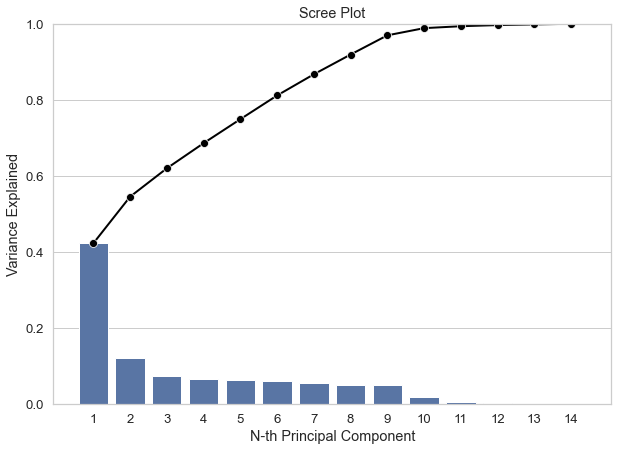

In [49]:
scree_plot(pca)

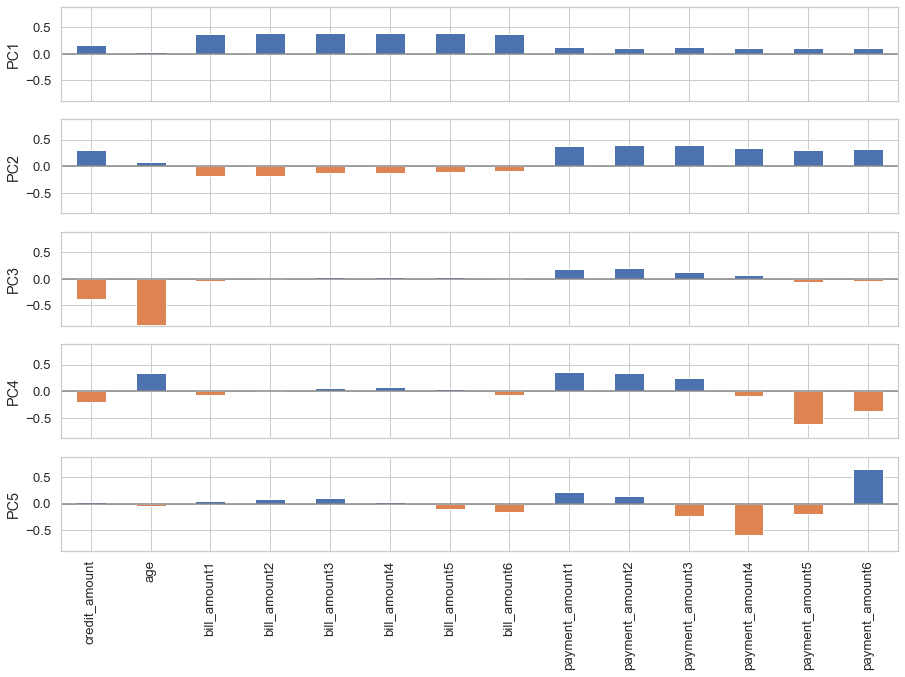

In [51]:
loadings = pd.DataFrame(pca.components_[0:5, :], columns=data_scaled[numerical_columns].columns)
maxPC = 1.01 * np.max(np.max(np.abs(loadings.loc[0:5, :])))
f, axes = plt.subplots(5, 1, figsize=(15, 10), sharex=True)
for i, ax in enumerate(axes):
 pc_loadings = loadings.loc[i, :]
 colors = ['C0' if l > 0 else 'C1' for l in pc_loadings]
 ax.axhline(color='#888888')
 pc_loadings.plot.bar(ax=ax, color=colors)
 ax.set_ylabel(f'PC{i+1}')
 ax.set_ylim(-maxPC, maxPC)

En el gráfico anterior podemos ver que:
- En el primer componente las variables mas importantes son las de bill amount.
- En el segundo las de Payment.
- En el tercero la más importante es la edad.
- El cuarto es un contraste entre los pagos de los primeros meses y los de los ultimos
- En el 5 la variable mas importante es el último pago realizado

### 8. Histrogramas

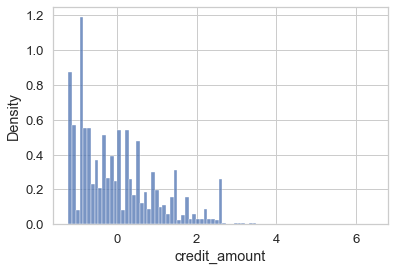

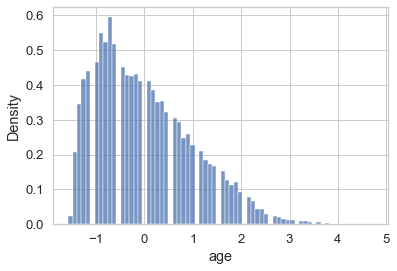

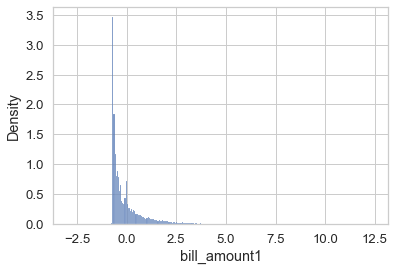

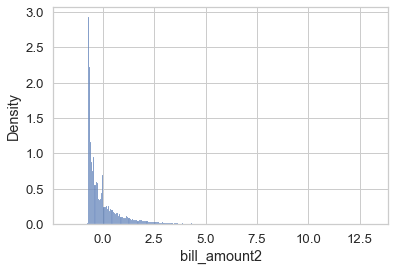

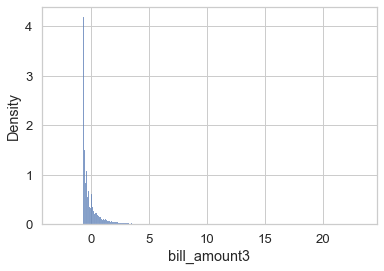

...

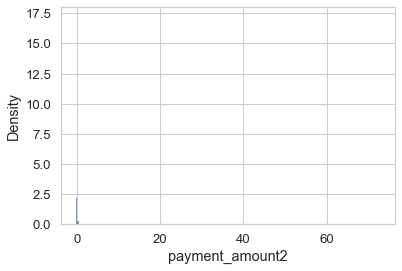

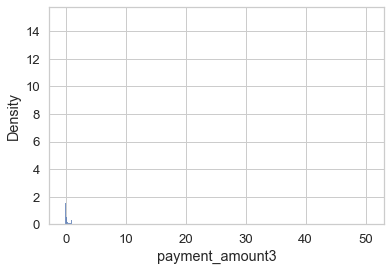

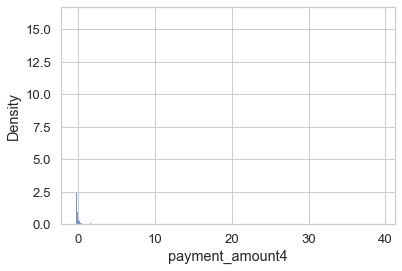

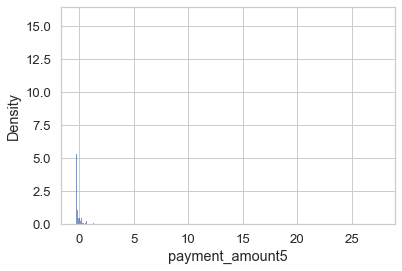

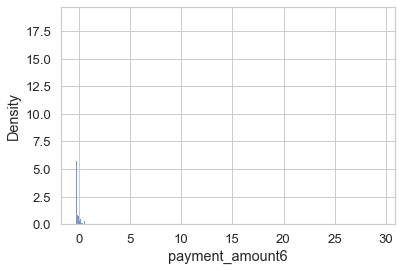

<Figure size 432x288 with 0 Axes>

In [59]:
for i in numerical_columns:
    sns.histplot(data=data_scaled, x=i,stat='density')
    plt.figure()


En los histogramas podemos ver lo que suponiamos, y es que la mayoría de las variables tienen un sesgo notable hacia la derecha y cuentan con valores atipicos en la misma dirección. Por otro lado vemos que las variables relacionados con el pago en $, tienen una alta proporción de 0s

### 9. Analisis Gráfico

Text(0.5, 1.0, 'Proporción de Defaults por Género')

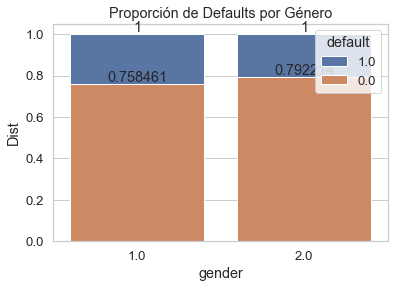

In [78]:
distribution = pd.crosstab(data_scaled.gender, data_scaled.default, normalize='index')
ax = sns.barplot(data=distribution.cumsum(axis=1).stack().reset_index(name='Dist'),
            x='gender', y='Dist', hue='default',
            hue_order = distribution.columns[::-1],   # reverse hue order so that the taller bars got plotted first
            dodge=False)
for container in ax.containers:
    ax.bar_label(container)

ax.set_title("Proporción de Defaults por Género")

En el gráfico anterior podemos observar que la proporción de mujeres que pagan el crédito a tiempo es 4% superior en las mujeres que en los hommbres, por lo cual esta variable podría ser útil al tratar de predecir un default.

In [91]:
fig = px.box(data_scaled, y="credit_amount", x="default",  hover_data=data_scaled.columns, title="credit amount distribution by credit result")
fig.show()

En el gráfico anterior podemos observar que los creditos que llegan a default tienden a ser mas pequeños que los créditos que se pegan adecudamente. Esto debe ser porqu el banco busca mayor seguridad cuando realiza prestamos grandes que caundo realiza prestamos pequeños.
Por otro lado, vemos valores atipicos en esta variable, lo cual se deberá tener en cuenta dependiendo del modelo que se quiera usar para modelar este problema, dado que algunos son altamente sensibles a valores atípicos.

In [109]:
temp = data_trans.groupby(['education'],as_index=False)['credit_amount'].sum()
fig = px.pie(temp, values='credit_amount', names='education', title='Percentage of total credit amount by education')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Del gráfico anterior podemos concluir que el mayor volumen de dinero se destina a personas con educación graduate school o university. Por lo cual podríamos enfocarnos en lograr mejores resultados en este grupo si queremos disminuir el dinero que se pierde a causa de falta de pago.